# 自家消費蓄電池容量の最適化方法（電力予測や需要予測を使わず、太陽光発電電力と消費電力（分毎のデータ）
# Battery Optimaization(for Critical Load & Not reverse Currrent to Grid)

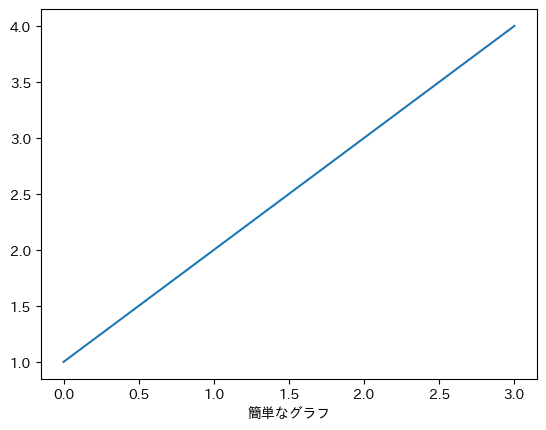

In [1]:
#matlabグラフの日本語化用、ここを参考に　https://qiita.com/uehara1414/items/6286590d2e1ffbf68f6c
import matplotlib.pyplot as plt
import japanize_matplotlib  # <- これ

plt.plot([1, 2, 3, 4])
plt.xlabel('簡単なグラフ')
plt.show()

# まずは消費電力のデータを用意して下さい。出来れば１分間隔。太陽光の発電量はシュミレーションソフトでパネル枚数と緯度データで算出出来かもしれません。以下サンプルデータ１１ヶ月分

In [2]:
import pandas as pd
from glob import glob
import numpy as np
import unicodedata

In [3]:
#sampleデータ（１分毎の発電電力と消費電力）differenceは１分毎の発電電力から消費電力を引いた値）
dfi=pd.read_csv(r"10kwRPVbattery.csv",index_col=0)
dfi

,日時,発電電力x1,メーター電力,difference
0,2021-01-01 00:02:00,0.000000,0.008,-0.008000
1,2021-01-01 00:03:00,0.000000,0.008,-0.008000
2,2021-01-01 00:04:00,0.000000,0.008,-0.008000
3,2021-01-01 00:05:00,0.000000,0.009,-0.009000
4,2021-01-01 00:06:00,0.000000,0.008,-0.008000
...,...,...,...,...
390446,2021-11-11 10:34:00,0.026767,0.040,-0.013233
390447,2021-11-11 10:35:00,0.040983,0.039,0.001983
390448,2021-11-11 10:36:00,0.065150,0.050,0.015150
390449,2021-11-11 10:37:00,0.029833,0.048,-0.018167


In [4]:
# １分毎のデータをcsvで取り込んが日時データを時系列で扱う為にdatetime形式に変換＊秒がある場合は削除して下さい。
dfi['Date'] = pd.to_datetime(dfi['日時'])  # 列を日本語から英語のdatetimeに変換

In [5]:
dfi=dfi.reindex(columns=['Date','発電電力x1', 'メーター電力','difference'])
dfi

,Date,発電電力x1,メーター電力,difference
0,2021-01-01 00:02:00,0.000000,0.008,-0.008000
1,2021-01-01 00:03:00,0.000000,0.008,-0.008000
2,2021-01-01 00:04:00,0.000000,0.008,-0.008000
3,2021-01-01 00:05:00,0.000000,0.009,-0.009000
4,2021-01-01 00:06:00,0.000000,0.008,-0.008000
...,...,...,...,...
390446,2021-11-11 10:34:00,0.026767,0.040,-0.013233
390447,2021-11-11 10:35:00,0.040983,0.039,0.001983
390448,2021-11-11 10:36:00,0.065150,0.050,0.015150
390449,2021-11-11 10:37:00,0.029833,0.048,-0.018167


In [6]:
#ここで発電量に係数を掛けて発電量を増やしたり減らしたりしてシミュレーションする為
#dfi['発電電力x1.5']=dfi['発電電力x1']*1.5

In [7]:
#夜のメーター電力を増やして負荷を任意に増やす為に負の値だけを増やす（3倍）にする。
# double_negative_values関数の定義
#def double_negative_values(value):
#    if value <= 0:
#        return value * 3 #負の値を3倍
#    else:
#        return value

# テスト用のデータフレームを作成
#df = pd.DataFrame({'difference': [-5, 3, 0, -2, 4]})

# 'difference'列の各値に対して関数を適用し、新しい列として追加
#dfi['double_negative_values'] = dfi['difference'].apply(double_negative_values)

# 結果のデータフレームを表示
#dfi

In [8]:
#データの分布を確認
dfi.describe()

,発電電力x1,メーター電力,difference
count,390451.000000,390451.000000,390451.000000
mean,0.016551,0.024376,-0.007825
std,0.029697,0.028255,0.032315
min,0.000000,0.001000,-0.132000
25%,0.000000,0.007000,-0.015667
50%,0.000000,0.010000,-0.008000
75%,0.021117,0.031000,-0.006000
max,0.152700,0.132000,0.144117


In [9]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
from matplotlib.ticker import MultipleLocator
import datetime

# Figureの初期化
fig = plt.figure(figsize=(300, 100))  # 適切なサイズに調整

# Figure内にAxesを追加()
ax = fig.add_subplot(111)  #...2

# X軸とY軸の線を太くする
ax.spines['bottom'].set_linewidth(10)  # X軸の線を太くする
ax.spines['left'].set_linewidth(10)    # Y軸の線を太くする

# 各データセットのプロット
ax.plot(dfi['Date'], dfi['メーター電力'], label="メーター電力", color='green', linewidth=20)
ax.plot(dfi['Date'], dfi['発電電力x1'], label="発電電力x1", color='red', linewidth=20)
ax.plot(dfi['Date'], dfi['difference'], label="diff", color='blue', linewidth=10)  # 棒グラフの幅を適切に指定

# 凡例の表示
plt.legend(bbox_to_anchor=(1, 1), loc='upper right', borderaxespad=0, fontsize=200)  # フォントサイズを調整

ax.set_xlim(datetime.datetime(2021,1,1), datetime.datetime(2021,1,10))  
#ax.set_ylim([-10,20])

# X軸の設定
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))  # 時間と分まで表示するフォーマットに変更
plt.xticks(rotation=45, fontsize=200)  # 軸の回転とフォントサイズを調整

# Y軸のラベルを設定
ax.set_ylabel('電力量 (kWh)', fontsize=200)
# Y軸の目盛りを10kWhの間隔に設定
ax.yaxis.set_major_locator(MultipleLocator(0.1))  # 10kWh
plt.yticks(fontsize=200)

#plt.axhline(y=50, color='blue', linestyle='-.', linewidth=10)
plt.axhline(y=0, linestyle='-', linewidth=10)

# プロット表示(設定の反映)
#plt.tight_layout()  # レイアウトを整える
#plt.savefig("pcs10kw.png")
plt.show()

In [10]:
#このうちバッテリーの充放電に関わるのはdifference
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
from matplotlib.ticker import MultipleLocator
import datetime

# Figureの初期化
fig = plt.figure(figsize=(300, 100))  # 適切なサイズに調整

# Figure内にAxesを追加()
ax = fig.add_subplot(111)  #...2

# X軸とY軸の線を太くする
ax.spines['bottom'].set_linewidth(10)  # X軸の線を太くする
ax.spines['left'].set_linewidth(10)    # Y軸の線を太くする

# 各データセットのプロット
#ax.plot(dfi['Date'], dfi['メーター電力'], label="メーター電力", color='green', linewidth=10)
#ax.plot(dfi['Date'], dfi['発電電力x1'], label="発電電力x1", color='red', linewidth=20)
ax.plot(dfi['Date'], dfi['difference'], label="diff", color='blue', linewidth=10)  # 棒グラフの幅を適切に指定

# 凡例の表示
plt.legend(bbox_to_anchor=(1, 1), loc='upper right', borderaxespad=0, fontsize=200)  # フォントサイズを調整

ax.set_xlim(datetime.datetime(2021,1,1), datetime.datetime(2021,1,10))  
#ax.set_ylim([-10,20])

# X軸の設定
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))  # 時間と分まで表示するフォーマットに変更
plt.xticks(rotation=45, fontsize=200)  # 軸の回転とフォントサイズを調整

# Y軸のラベルを設定
ax.set_ylabel('電力量 (kWh)', fontsize=200)
# Y軸の目盛りを10kWhの間隔に設定
ax.yaxis.set_major_locator(MultipleLocator(0.1))  # 10kWh
plt.yticks(fontsize=200)

#plt.axhline(y=50, color='blue', linestyle='-.', linewidth=10)
plt.axhline(y=0, linestyle='-', linewidth=10)

# プロット表示(設定の反映)
#plt.tight_layout()  # レイアウトを整える
#plt.savefig("pcs10kw.png")
plt.show()

In [11]:
dfi.dtypes

Date          datetime64[ns]
発電電力x1               float64
メーター電力               float64
difference           float64
dtype: object

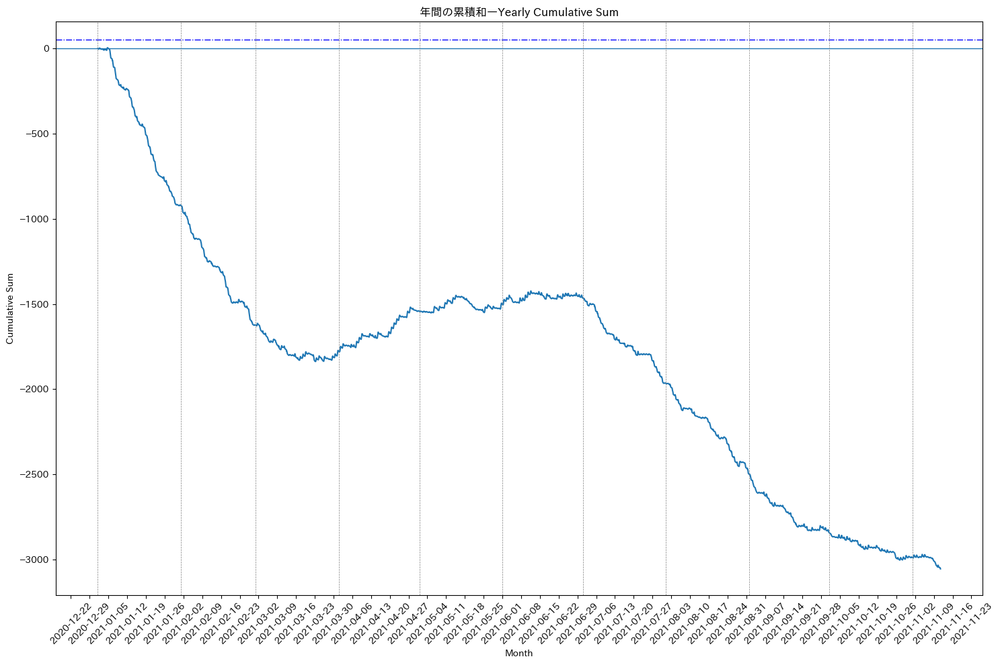

In [13]:
# 毎月の縦線を追加するための日付リストを生成
monthly_lines = pd.date_range(start=dfi['Date'].min(), end=dfi['Date'].max(), freq='MS')

# 毎日の累積和を計算
daily_cumulative_sums = dfi.copy()
daily_cumulative_sums['cumulative_sum'] = daily_cumulative_sums['difference'].cumsum()

# 毎日の累積和のプロット
fig, ax = plt.subplots(figsize=(15, 10))
ax.plot(daily_cumulative_sums['Date'], daily_cumulative_sums['cumulative_sum'], marker='', linestyle='-')
ax.set_title('年間の累積和ーYearly Cumulative Sum')
ax.set_xlabel('Month')
ax.set_ylabel('Cumulative Sum')
ax.axhline(y=50, color='blue', linestyle='-.', linewidth=1)
ax.axhline(y=0, linestyle='-', linewidth=1)
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))
# 毎月の線を追加
for date in monthly_lines:
    ax.axvline(date, color='grey', linestyle='--', linewidth=0.5)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ±のBlock毎の充放電量累積和

In [15]:
import pandas as pd

def calculate_blocks_sums_and_durations(dfi):
    # 連続する正または負のブロックを識別するための列を追加
    dfi['sign'] = dfi['difference'].apply(lambda x: 1 if x > 0 else (-1 if x < 0 else 0))
    dfi['block_change'] = dfi['sign'].diff().ne(0).cumsum()
    
    # 連続する同じ符号のブロックのみを対象とする
    dfi_filtered = dfi[dfi['sign'] != 0]
    
    # 各ブロックの累積和と日時の計算
    blocks_summary = dfi_filtered.groupby('block_change').agg(
        start_datetime=('Date', 'min'),
        end_datetime=('Date', 'max'),
        cumulative_sum=('difference', 'sum'),
        differences=('difference', list)  # 各ブロックのdifferenceの値のリストを保持
    ).reset_index(drop=True)
    
    return blocks_summary

# 注: 実際にこの関数を使用する前に、dfi データフレームに 'datetime' 列と 'difference' 列が存在し、
# 'datetime' 列が適切な日付時刻形式であることを確認してください。
df=calculate_blocks_sums_and_durations(dfi)
df

,start_datetime,end_datetime,cumulative_sum,differences
0,2021-01-01 00:02:00,2021-01-01 07:57:00,-3.775717,"[-0.008, -0.008, -0.008, -0.009, -0.008, -0.00..."
1,2021-01-01 07:58:00,2021-01-01 15:52:00,6.063000,"[0.0011666666666666, 0.0030499999999999, 0.004..."
2,2021-01-01 15:53:00,2021-01-01 15:55:00,-0.001700,"[-6.666666666666713e-05, -0.0004, -0.001233333..."
3,2021-01-01 15:57:00,2021-01-02 07:54:00,-7.207067,"[-0.0001166666666666, -0.0013166666666666, -0...."
4,2021-01-02 07:55:00,2021-01-02 07:55:00,0.000100,[9.99999999999994e-05]
...,...,...,...,...
5781,2021-11-10 14:43:00,2021-11-10 14:43:00,0.003617,[0.0036166666666666]
5782,2021-11-10 14:44:00,2021-11-11 10:34:00,-21.050183,"[-0.0165833333333333, -0.0146833333333333, -0...."
5783,2021-11-11 10:35:00,2021-11-11 10:36:00,0.017133,"[0.0019833333333333, 0.0151499999999999]"
5784,2021-11-11 10:37:00,2021-11-11 10:37:00,-0.018167,[-0.0181666666666666]


In [20]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
from matplotlib.ticker import MultipleLocator
# データの準備: 正の値と負の値でデータフレームを分ける
df_positive = df[df['cumulative_sum'] > 0]
df_negative = df[df['cumulative_sum'] < 0]

# Figureの初期化
fig = plt.figure(figsize=(300, 100))  # 適切なサイズに調整

# Figure内にAxesを追加()
ax = fig.add_subplot(111)  #...2

# X軸とY軸の線を太くする
#ax.spines['bottom'].set_linewidth(10)  # X軸の線を太くする
ax.spines['left'].set_linewidth(10)    # Y軸の線を太くする

# 各データセットのプロット
# 正の値の棒グラフ
ax.bar(df_positive['start_datetime'], df_positive['cumulative_sum'], label="+ Cumulative Sum", color='green')
#ax.bar(df_positive['end_datetime'], df_positive['cumulative_sum'], label="Positive Cumulative Sum", color='blue')

# 負の値の棒グラフ
ax.bar(df_negative['start_datetime'], df_negative['cumulative_sum'], label="- Cumulative Sum", color='red')
#ax.bar(df_negative['end_datetime'], df_negative['cumulative_sum'], label="Negative Cumulative Sum", color='pink')

# その他の設定は同じ...

#ax.bar(df['start_datetime'], df['cumulative_sum'], label="cumulative_sum", color='red', linewidth=0.01)
#ax.plot(dfi['Date'], dfi['Under'], label="Under", color='red', linewidth=10)
#ax.plot(dfi['Date'], dfi['CumSumUptoCapacity'], label="蓄電池容量dfi", color='blue', linewidth=10)  # 棒グラフの幅を適切に指定

# 凡例の表示
plt.legend(bbox_to_anchor=(1, 1), loc='upper right', borderaxespad=0, fontsize=200)  # フォントサイズを調整

# X軸の設定
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))  # 時間と分まで表示するフォーマットに変更
plt.xticks(rotation=45, fontsize=200)  # 軸の回転とフォントサイズを調整

ax.set_xlim(datetime.datetime(2021,1,1), datetime.datetime(2021,11,1))  
#ax.set_ylim([-100,500])
ax.set_title('±のブロックの累積和ーCumulative Sum', fontsize=200)

# Y軸のラベルを設定
ax.set_ylabel('', fontsize=200)
# Y軸の目盛りを10kWhの間隔に設定
ax.yaxis.set_major_locator(MultipleLocator(50))  # 10kWh
plt.yticks(fontsize=200)

plt.axhline(y=50, color='blue', linestyle='-.', linewidth=10)
plt.axhline(y=0, linestyle='-', linewidth=10)

# プロット表示(設定の反映)
#plt.tight_layout()  # レイアウトを整える
#plt.savefig("errorpcs20kw50kWhbattery.png")
plt.show()

In [21]:
# -の値だけを抜き出して色分け。
df_negative = df[df['cumulative_sum'] < 0]
df_negative.describe()

,cumulative_sum
count,2896.000000
mean,-2.036787
std,7.352831
min,-120.886117
25%,-0.206071
50%,-0.023692
75%,-0.003750
max,-0.000017


In [23]:
# -の値を左からおおきい順に並び替えて大きなデータの量を確認。
df_sorted_desc = df_negative.sort_values(by='cumulative_sum', ascending=True)
df_sorted_desc_reset = df_sorted_desc.reset_index(drop=True)
df_sorted_desc_reset 

,start_datetime,end_datetime,cumulative_sum,differences
0,2021-01-11 16:04:00,2021-01-14 11:49:00,-120.886117,"[-8.333333333333456e-05, -0.0024999999999999, ..."
1,2021-01-21 13:30:00,2021-01-23 15:34:00,-118.338533,"[-0.02475, -0.02605, -0.0262666666666666, -0.0..."
2,2021-01-06 12:46:00,2021-01-08 10:08:00,-114.403350,"[-0.0122333333333333, -0.0162833333333333, -0...."
3,2021-02-25 15:39:00,2021-02-27 09:51:00,-90.875000,"[-0.0053666666666666, -0.00845, -0.02063333333..."
4,2021-01-04 15:45:00,2021-01-06 11:34:00,-75.764217,"[-0.0007166666666666, -6.666666666666626e-05, ..."
...,...,...,...,...
2891,2021-03-27 06:35:00,2021-03-27 06:35:00,-0.000017,[-1.6666666666667433e-05]
2892,2021-01-03 15:23:00,2021-01-03 15:23:00,-0.000017,[-1.6666666666666566e-05]
2893,2021-09-28 07:47:00,2021-09-28 07:47:00,-0.000017,[-1.6666666666666566e-05]
2894,2021-03-25 13:10:00,2021-03-25 13:10:00,-0.000017,[-1.666666666666483e-05]


# マイナスだけを抜き出して大きい方から左から順に並び替え

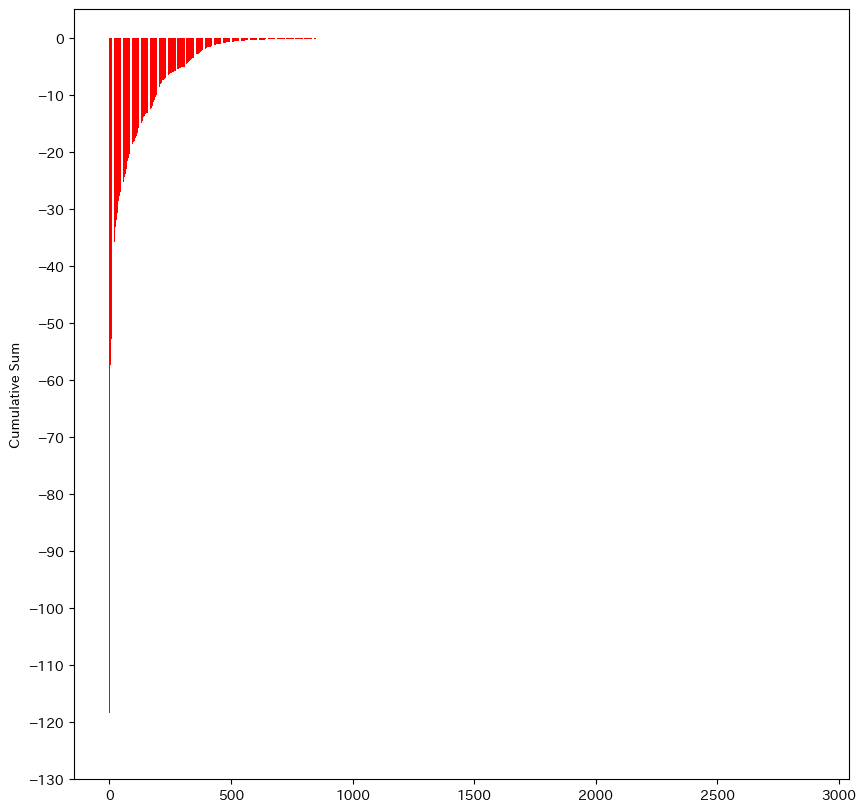

In [33]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import pandas as pd

# 既に負の値であることが分かっているので、単に絶対値で昇順にソートします。

# Figureの初期化
fig, ax = plt.subplots(figsize=(10, 10))  # サイズは適宜調整してください。

# 負の値の棒グラフ
ax.bar(df_sorted_desc_reset.index, df_sorted_desc_reset['cumulative_sum'], color='red')

# X軸の設定
plt.xticks(fontsize=10)

# Y軸の設定
ax.set_ylabel('Cumulative Sum', fontsize=10)
ax.yaxis.set_major_locator(MultipleLocator(10))  # Y軸の目盛りの間隔を設定
plt.yticks(fontsize=10)
ax.set_ylim([-130,5])
# 水平線を追加
#plt.axhline(y=0, linestyle='-', linewidth=1, color='blue')

# プロット表示
plt.show()

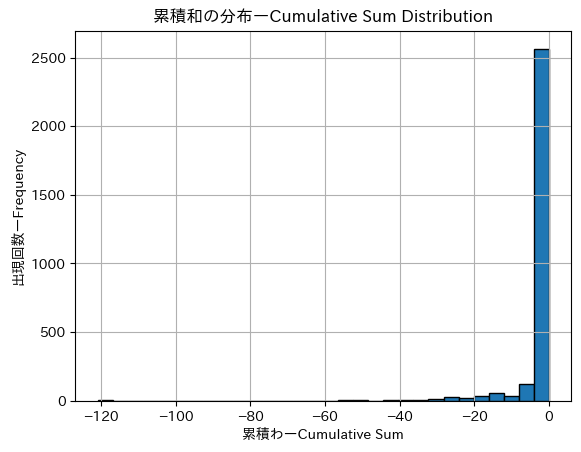

In [35]:
# Pandasのhistメソッドを使用してヒストグラムを描画
df_sorted_desc_reset['cumulative_sum'].hist(bins=30, edgecolor='black')
plt.title('累積和の分布ーCumulative Sum Distribution')
plt.xlabel('累積わーCumulative Sum')
plt.ylabel('出現回数ーFrequency')
plt.show()

## 極端に大きなマイナスもありますが、ヒストグラムでマイナスの値の出現回数（ヒストグラム）を出すとバッテリーのおおよその必要量の参考になると思います。
## この場合h１０k Wh以上あっても夜間の電力補完以上の用途が明確でないと充放電されることは稀、但し曇りの日が続く場合は幾何分布に従うとして
## P(3日連続雨)=p×p×p=0.3×0.3×0.3としてこの計算を実行して、3日連続で雨が降る確率は約0.027、つまり2.7%です。
## これは、雨の日の確率が30%である場合に、3日連続で雨が降る確率が比較的低いことを示しています。
## と考えれば3倍の３０k Whで何とかなりそうですね。

# <span style="color:red">以下参考資料</span>

# ここかは参考資料、differenceの累積和で右肩下がりですが、直前のマイナスの値からプラスになる分を累積和しないアルゴリズムにしました。グラフが見易くなると思います。
## 仮にバッテリーがあり放電で賄われたと仮定するとこんなグラフになります。春から夏の終わりに掛けて余剰電力が増えてくる状態が分かりやすくなります。
## 発電量がもっと上がると累積は逆に降ってきません。

In [38]:
#import pandas as pd

# サンプルデータフレームを作成
#df = pd.DataFrame({'X': [-1, -3, 5, 7, -1, -3, -50, 2, 51, 1, 20, 30, 50, -20]})

# 条件に基づく累積和を計算する関数
def custom_cumsum(series):
    result = []
    cumsum = 0  # 累積和を初期化
    over= 0  # 50を超えた分の累積
    under = 0  # マイナスの累積

    for value in series:
        if value >= 0 and cumsum < 0:
            cumsum = value  # 累積和をvalueでリセット
        else:
            cumsum += value  # 累積和(cumulative sum)にvalueを加算

        # 累積和が(50)を超える場合、overを更新 ここで蓄電池容量を設定
        if cumsum > 50:
            over = cumsum - 50
        else:
            over = 0  # 累積和が（50）以下の場合、overをリセット

        # 累積和が0未満の場合、累積和を0にリセットし、マイナスの累積を追跡
        if cumsum < 0:
            under = cumsum  # マイナスの累積和を更新
        else:
            under = 0  # 累積和が0以上の場合、underをリセット

        result.append((value, cumsum, over, under))

    return pd.DataFrame(result, columns=['Value', 'CumSum', 'Over(50kWh)', 'Under'])

# カスタム関数を適用
df_diff = custom_cumsum(dfi['difference'])

# 結果を表示
print(df_diff)

           Value     CumSum  Over(50kWh)      Under
0      -0.008000  -0.008000          0.0  -0.008000
1      -0.008000  -0.016000          0.0  -0.016000
2      -0.008000  -0.024000          0.0  -0.024000
3      -0.009000  -0.033000          0.0  -0.033000
4      -0.008000  -0.041000          0.0  -0.041000
...          ...        ...          ...        ...
390446 -0.013233 -10.939633          0.0 -10.939633
390447  0.001983   0.001983          0.0   0.000000
390448  0.015150   0.017133          0.0   0.000000
390449 -0.018167  -0.001033          0.0  -0.001033
390450  0.003417   0.003417          0.0   0.000000

[390451 rows x 4 columns]


In [39]:
df_diff['CumSumDropBelow0'] = df_diff['CumSum'].apply(lambda x: max(x, 0))
df_diff

,Value,CumSum,Over(50kWh),Under,CumSumDropBelow0
0,-0.008000,-0.008000,0.0,-0.008000,0.000000
1,-0.008000,-0.016000,0.0,-0.016000,0.000000
2,-0.008000,-0.024000,0.0,-0.024000,0.000000
3,-0.009000,-0.033000,0.0,-0.033000,0.000000
4,-0.008000,-0.041000,0.0,-0.041000,0.000000
...,...,...,...,...,...
390446,-0.013233,-10.939633,0.0,-10.939633,0.000000
390447,0.001983,0.001983,0.0,0.000000,0.001983
390448,0.015150,0.017133,0.0,0.000000,0.017133
390449,-0.018167,-0.001033,0.0,-0.001033,0.000000


In [40]:
#50kWh以上にするときはその容量に書き換える
df_diff['CumSumUptoCapacity'] = df_diff['CumSumDropBelow0'].apply(lambda x: min(x, 50))
df_diff.head()

,Value,CumSum,Over(50kWh),Under,CumSumDropBelow0,CumSumUptoCapacity
0,-0.008,-0.008,0.0,-0.008,0.0,0.0
1,-0.008,-0.016,0.0,-0.016,0.0,0.0
2,-0.008,-0.024,0.0,-0.024,0.0,0.0
3,-0.009,-0.033,0.0,-0.033,0.0,0.0
4,-0.008,-0.041,0.0,-0.041,0.0,0.0


In [41]:
dfi = pd.concat([dfi, df_diff], axis=1)
dfi

,Date,発電電力x1,メーター電力,difference,sign,block_change,Value,CumSum,Over(50kWh),Under,CumSumDropBelow0,CumSumUptoCapacity
0,2021-01-01 00:02:00,0.000000,0.008,-0.008000,-1,1,-0.008000,-0.008000,0.0,-0.008000,0.000000,0.000000
1,2021-01-01 00:03:00,0.000000,0.008,-0.008000,-1,1,-0.008000,-0.016000,0.0,-0.016000,0.000000,0.000000
2,2021-01-01 00:04:00,0.000000,0.008,-0.008000,-1,1,-0.008000,-0.024000,0.0,-0.024000,0.000000,0.000000
3,2021-01-01 00:05:00,0.000000,0.009,-0.009000,-1,1,-0.009000,-0.033000,0.0,-0.033000,0.000000,0.000000
4,2021-01-01 00:06:00,0.000000,0.008,-0.008000,-1,1,-0.008000,-0.041000,0.0,-0.041000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
390446,2021-11-11 10:34:00,0.026767,0.040,-0.013233,-1,5808,-0.013233,-10.939633,0.0,-10.939633,0.000000,0.000000
390447,2021-11-11 10:35:00,0.040983,0.039,0.001983,1,5809,0.001983,0.001983,0.0,0.000000,0.001983,0.001983
390448,2021-11-11 10:36:00,0.065150,0.050,0.015150,1,5809,0.015150,0.017133,0.0,0.000000,0.017133,0.017133
390449,2021-11-11 10:37:00,0.029833,0.048,-0.018167,-1,5810,-0.018167,-0.001033,0.0,-0.001033,0.000000,0.000000


In [42]:
dfi=dfi.reindex(columns=['Date','発電電力x1', 'メーター電力','difference','CumSum','Over(50kWh)','Under','CumSumDropBelow0','CumSumUptoCapacity'])
dfi

,Date,発電電力x1,メーター電力,difference,CumSum,Over(50kWh),Under,CumSumDropBelow0,CumSumUptoCapacity
0,2021-01-01 00:02:00,0.000000,0.008,-0.008000,-0.008000,0.0,-0.008000,0.000000,0.000000
1,2021-01-01 00:03:00,0.000000,0.008,-0.008000,-0.016000,0.0,-0.016000,0.000000,0.000000
2,2021-01-01 00:04:00,0.000000,0.008,-0.008000,-0.024000,0.0,-0.024000,0.000000,0.000000
3,2021-01-01 00:05:00,0.000000,0.009,-0.009000,-0.033000,0.0,-0.033000,0.000000,0.000000
4,2021-01-01 00:06:00,0.000000,0.008,-0.008000,-0.041000,0.0,-0.041000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
390446,2021-11-11 10:34:00,0.026767,0.040,-0.013233,-10.939633,0.0,-10.939633,0.000000,0.000000
390447,2021-11-11 10:35:00,0.040983,0.039,0.001983,0.001983,0.0,0.000000,0.001983,0.001983
390448,2021-11-11 10:36:00,0.065150,0.050,0.015150,0.017133,0.0,0.000000,0.017133,0.017133
390449,2021-11-11 10:37:00,0.029833,0.048,-0.018167,-0.001033,0.0,-0.001033,0.000000,0.000000


In [43]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
from matplotlib.ticker import MultipleLocator

# Figureの初期化
fig = plt.figure(figsize=(300, 100))  # 適切なサイズに調整

# Figure内にAxesを追加()
ax = fig.add_subplot(111)  #...2

# X軸とY軸の線を太くする
#ax.spines['bottom'].set_linewidth(10)  # X軸の線を太くする
ax.spines['left'].set_linewidth(10)    # Y軸の線を太くする

# 各データセットのプロット
#ax.plot(dfi['Date'], dfi['Over(50kWh)'], label="Over(50kWh)", color='pink', linewidth=30)
ax.plot(dfi['Date'], dfi['CumSumDropBelow0'], label="0以上の累積", color='pink', linewidth=30)
ax.plot(dfi['Date'], dfi['Under'], label="Under", color='red', linewidth=10)
ax.plot(dfi['Date'], dfi['CumSumUptoCapacity'], label="batteryCapacity", color='blue', linewidth=10)  # 棒グラフの幅を適切に指定
#ax.plot(dfi['Date'], dfi['CumSum'], label="CumSum", color='Green', linewidth=40)  # 棒グラフの幅を適切に指定

# 凡例の表示
plt.legend(bbox_to_anchor=(1, 1), loc='upper right', borderaxespad=0, fontsize=200)  # フォントサイズを調整

# X軸の設定
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))  # 時間と分まで表示するフォーマットに変更
plt.xticks(rotation=45, fontsize=200)  # 軸の回転とフォントサイズを調整

ax.set_xlim(datetime.datetime(2021,1,1), datetime.datetime(2021,11,30))  
ax.set_ylim([-100,500])

# Y軸のラベルを設定
ax.set_ylabel('電力量 (kWh)', fontsize=200)
# Y軸の目盛りを10kWhの間隔に設定
ax.yaxis.set_major_locator(MultipleLocator(50))  # 10kWh
plt.yticks(fontsize=200)

plt.axhline(y=50, color='blue', linestyle='-.', linewidth=10)
plt.axhline(y=0, linestyle='-', linewidth=10)

# プロット表示(設定の反映)
#plt.tight_layout()  # レイアウトを整える
#plt.savefig("pcs20kwJanFebhbattery.png")
plt.show()